In [4]:
import zipfile
import os

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

### Extract Image datasets

In [2]:
# Paths for the dataset
zip_file_path = '../data/raw/archive (7).zip'
extract_to_path = '../data/raw/'

# Unzipping the dataset
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # List all files inside the zip
    zip_contents = zip_ref.namelist()
    
    # Check if the first item in the zip is the 'PlantVillage' folder
    if zip_contents[0].startswith('PlantVillage'):
        # Extract everything inside the 'PlantVillage' folder directly into the target path
        for file in zip_contents:
            # Remove 'PlantVillage/' from the path to avoid nesting
            if file.startswith('PlantVillage/'):
                zip_ref.extract(file, extract_to_path)
    else:
        # Extract everything as normal if there's no 'PlantVillage' folder nesting
        zip_ref.extractall(extract_to_path)


In [3]:
# Path to the dataset where the classes (disease labels) are located
data_path = '../data/raw/PlantVillage'

# List all subdirectories (representing the disease labels) in the dataset directory
classes = [d for d in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, d))]

print(f"Classes (Disease Labels): {classes}")

Classes (Disease Labels): ['Tomato_healthy', 'Potato___Early_blight', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato_Early_blight', 'Tomato__Target_Spot', 'Potato___Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato_Septoria_leaf_spot', 'Tomato__Tomato_mosaic_virus', 'Pepper__bell___Bacterial_spot', 'Tomato_Bacterial_spot', 'Tomato_Late_blight', 'Pepper__bell___healthy', 'Potato___healthy']


### Visualize Sample Images

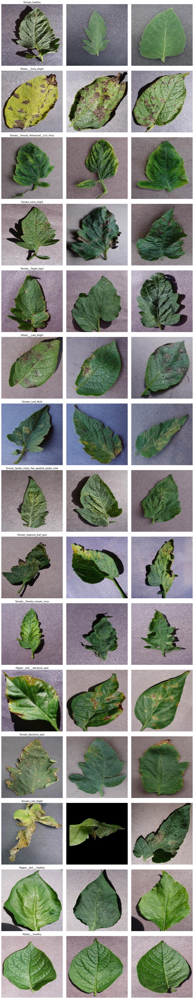

In [7]:
# Function to display sample images from each class
def display_sample_images(base_path, classes, num_samples=3):
    num_classes = len(classes)
    plt.figure(figsize=(15, num_classes * 5))
    
    for i, class_name in enumerate(classes):
        class_path = os.path.join(base_path, class_name)
        image_files = os.listdir(class_path)
        
        # Ensure we do not exceed available images
        num_samples_in_class = min(num_samples, len(image_files))
        sample_images = image_files[:num_samples_in_class]
        
        for j, image_file in enumerate(sample_images):
            img_path = os.path.join(class_path, image_file)
            try:
                img = mpimg.imread(img_path)
                
                plt.subplot(num_classes, num_samples, i * num_samples + j + 1)
                plt.imshow(img)
                plt.axis('off')
                if j == 0:
                    plt.title(class_name, fontsize=12)
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
    
    plt.tight_layout()
    plt.savefig('../plots/plants.png')
    plt.show()

# Display sample images
display_sample_images(data_path, classes)